# INF 552 - Homework 4

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn import model_selection
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor

## 1. The LASSO and Boosting for Regression 

### (a) Download the Communities and Crime data
Use the first 1495 rows of data as the training set and the rest as the test set.

### (b) Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features. 

In [2]:
cols = []
fh = open('communities.names', 'r')
for f in fh:
    if f.startswith('@attribute'):
        cols.append(f.split()[1])

df = pd.read_csv('communities.data.csv',header=None)
df.columns = cols

df = df.iloc[:,5:] # Ignore nonpredictive features
df = df.applymap(lambda x: np.nan if x == '?' else x)
df.head()

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [3]:
# Split into train and test then perform data imputation on each individually
train_df = df.iloc[:1495,:]
train_df = train_df.apply(pd.to_numeric, errors='ignore')
train_df = train_df.fillna(value = train_df.mean())

test_df = df.iloc[1495:, :]
test_df = test_df.apply(pd.to_numeric, errors='ignore')
test_df = test_df.fillna(value = test_df.mean())

df = pd.concat([train_df, test_df])

### (c) Plot a correlation matrix for the features in the data set. 

In [4]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 122)
corr_matrix = df.corr()
corr_matrix.style.background_gradient(cmap='RdPu').set_precision(2)

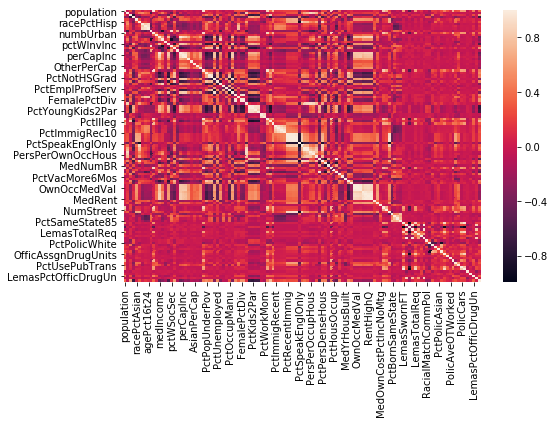

In [121]:
plt.figure(figsize=(8, 5))
sns.heatmap(df.corr())

### (d) Calculate the Coefficient of Variation CV for each feature. 

In [122]:
mean_df = df.mean(axis=0).to_frame()
mean_df.columns = ['mean']
var_df = df.var(axis=0).to_frame()
var_df.columns = ['var']
coeff_df = pd.concat([var_df, mean_df], axis=1)
coeff_df['coeff_var'] = coeff_df['var'] / coeff_df['mean'] 
coeff_df

,var,mean,coeff_var
population,0.016105,0.057593,0.279637
householdsize,0.026803,0.463395,0.057841
racepctblack,0.064233,0.179629,0.357587
racePctWhite,0.059555,0.753716,0.079015
racePctAsian,0.043630,0.153681,0.283898
racePctHisp,0.054052,0.144022,0.375306
agePct12t21,0.024086,0.424218,0.056777
agePct12t29,0.020610,0.493867,0.041733
agePct16t24,0.027724,0.336264,0.082446
agePct65up,0.032107,0.423164,0.075875


### (e) Pick features with highest CV , and make scatter plots and box plots for them. 

In [123]:
num_features = np.floor(np.sqrt(128))

sorted_df = coeff_df.sort_values(by=['coeff_var'], ascending=False)
top_cv = sorted(list(sorted_df.iloc[:int(num_features),:].index))
print(top_cv)
top_cv_df = df.loc[:, top_cv]
top_cv_df.head()

['LemasPctOfficDrugUn', 'NumIlleg', 'NumInShelters', 'NumStreet', 'PctNotSpeakEnglWell', 'PctRecImmig5', 'PctRecImmig8', 'PctRecentImmig', 'PctUsePubTrans', 'racePctHisp', 'racepctblack']


,LemasPctOfficDrugUn,NumIlleg,NumInShelters,NumStreet,PctNotSpeakEnglWell,PctRecImmig5,PctRecImmig8,PctRecentImmig,PctUsePubTrans,racePctHisp,racepctblack
0,0.32,0.04,0.04,0.0,0.06,0.07,0.08,0.07,0.20,0.17,0.02
1,0.00,0.00,0.00,0.0,0.10,0.27,0.25,0.25,0.45,0.07,0.12
2,0.00,0.01,0.00,0.0,0.04,0.02,0.04,0.02,0.02,0.04,0.49
3,0.00,0.03,0.00,0.0,0.08,0.08,0.11,0.05,0.28,0.10,1.00
4,0.00,0.00,0.00,0.0,0.05,0.02,0.04,0.01,0.02,0.05,0.02


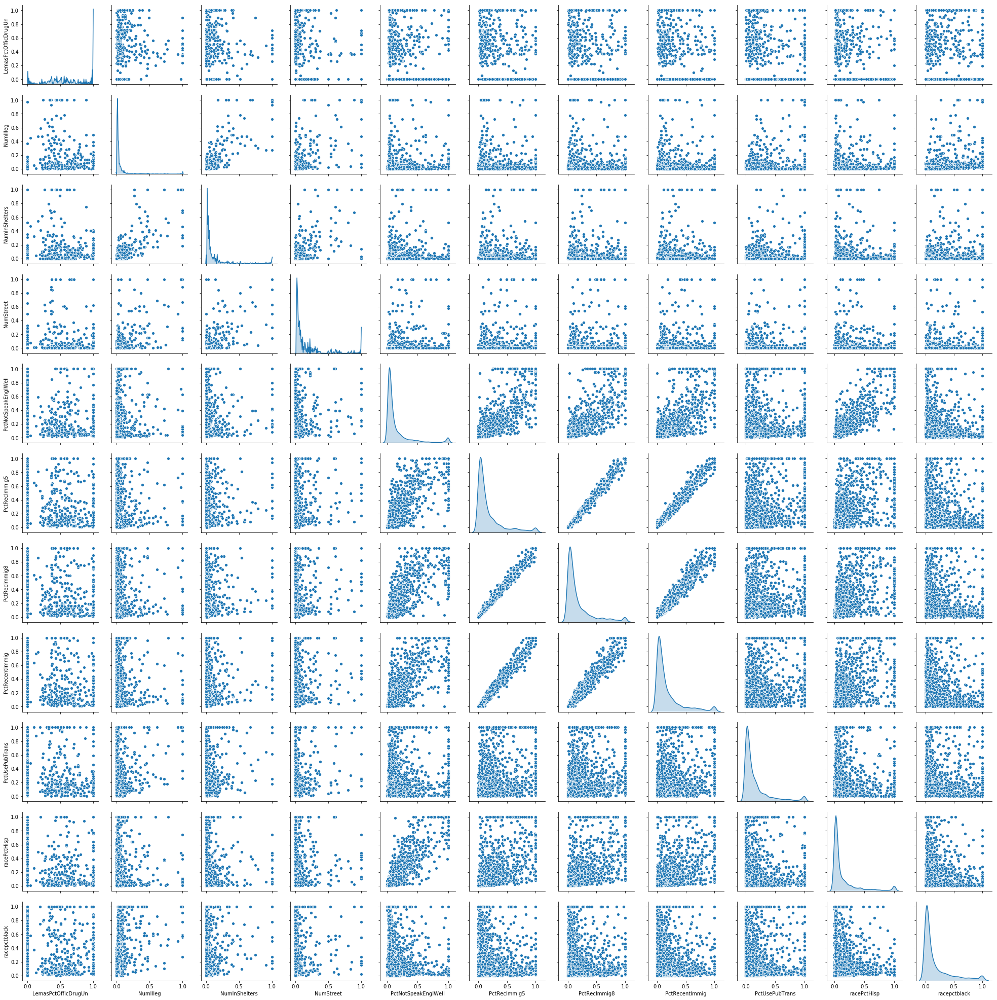

In [124]:
sns.pairplot(top_cv_df, diag_kind='kde')

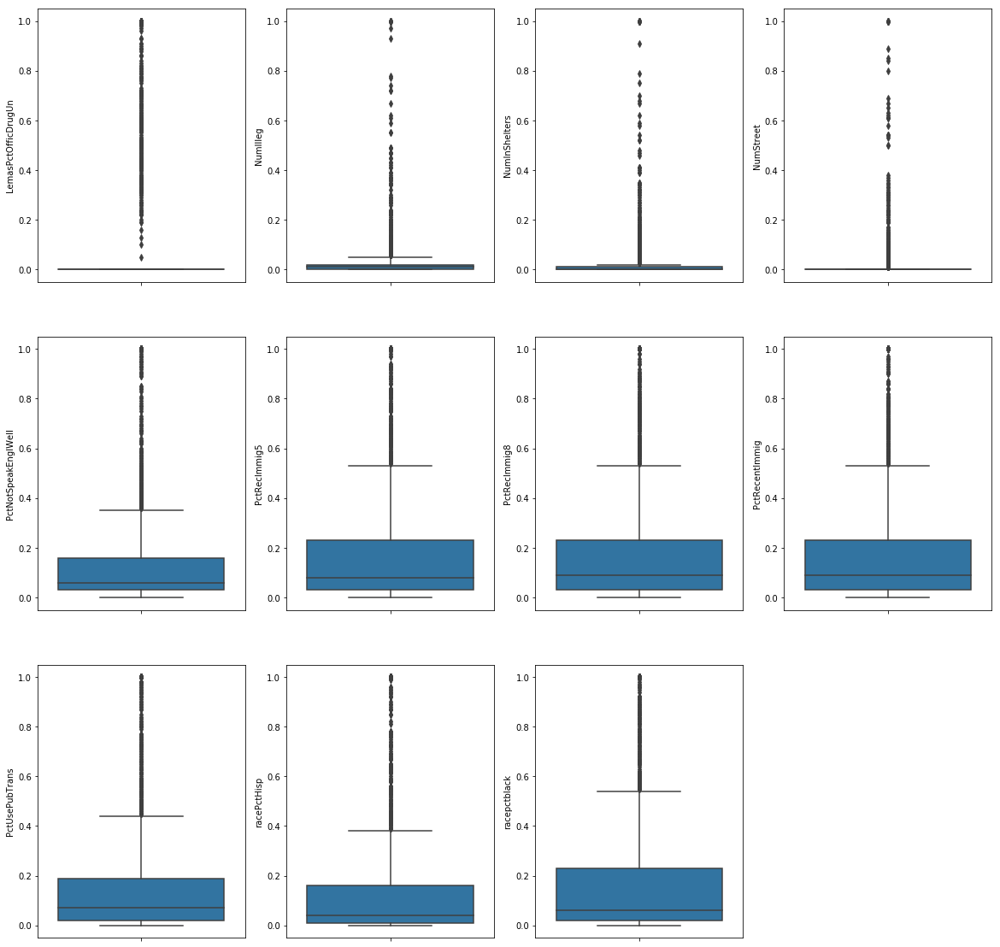

In [126]:
ind_variables = [2, 5, 49, 56, 57, 58, 61, 89, 90, 115, 120]
plt.figure(figsize=(20,20))
subplt = 1
for i in range(0,len(top_cv)):
    plt.subplot(3,4, subplt)
    sns.boxplot(y = top_cv[i], data=df)
    subplt += 1

Based on the scatterplots, there may be multicollinearity between PctImmigRec5, PctImmigRec8, PctRecentImmig. The plots between each of these features all demonstrate a strong positive correlation between each of these features. Because these three features seem to be highly correlated, it could increase the standard errors of their coefficients, and potentially make those coefficients unstable in several ways. It also seems that PctNotSpeakEnglWell has a slight positive correlation with racePctHisp, PctImmigRec5, PctImmigRec8, PctRecentImmig. 

### (f) Fit a linear model using least squares to the training set and report the test error. 

In [7]:
X_train = train_df.iloc[:,:-1]
y_train = train_df.iloc[:,-1]
X_test = test_df.iloc[:,:-1]
y_test = test_df.iloc[:,-1]

lm = LinearRegression().fit(X_train, y_train)
y_pred = lm.predict(X_test)
test_MSE = round(metrics.mean_squared_error(y_test, y_pred),3)
print('The MSE for test set is:', test_MSE)

The MSE for test set is: 0.018


I previously calculated the Linear Regression when performing data imputation on the entire dataset before splitting into train and test sets. When I performed it this way, my MSE for test set was 0.79. However, the professor recommended splitting the data into train and test set before performing the data imputation on them separately since this would mimick the real world more accurately. When doing it this way, the MSE for test set drops to 0.018.

### (g) Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained. 

In [129]:
reg = RidgeCV(cv=10, normalize=False)
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
test_MSE = round(metrics.mean_squared_error(y_test, y_pred),5)
print('The MSE for test set is %f with best lambda = %f.' %(test_MSE, reg.alpha_))

The MSE for test set is 0.017720 with best lambda = 1.000000.


### (h) Fit a LASSO model on the training set, with λ chosen by cross-validation. 

In [135]:
reg = LassoCV(cv=10, normalize=False) 
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
test_MSE = metrics.mean_squared_error(y_test, y_pred)
print('The MSE for test set is %f with best lambda = %f.' %(test_MSE, reg.alpha_))

The MSE for test set is 0.017749 with best lambda = 0.000108.


In [139]:
features=[]
for i in range(0,df.shape[1]-1):
    if reg.coef_[i]!= 0:
        features.append(i)
print('Variables Selected by the Model: ')
selected_features = ', '.join(list(df.columns[features]))
print(selected_features)


Variables Selected by the Model: 
racepctblack, racePctAsian, agePct12t21, agePct12t29, agePct65up, pctUrban, pctWWage, pctWFarmSelf, pctWInvInc, pctWSocSec, pctWPubAsst, pctWRetire, whitePerCap, blackPerCap, indianPerCap, AsianPerCap, OtherPerCap, HispPerCap, PctPopUnderPov, PctLess9thGrade, PctBSorMore, PctEmploy, PctEmplManu, PctOccupManu, MalePctDivorce, MalePctNevMarr, FemalePctDiv, PctKids2Par, PctYoungKids2Par, PctTeen2Par, PctWorkMom, NumIlleg, PctIlleg, NumImmig, PctImmigRec10, PctRecImmig10, PctNotSpeakEnglWell, PctLargHouseOccup, PersPerOccupHous, PctPersOwnOccup, PctPersDenseHous, PctHousLess3BR, MedNumBR, HousVacant, PctHousOccup, PctVacantBoarded, PctVacMore6Mos, MedYrHousBuilt, PctHousNoPhone, PctWOFullPlumb, OwnOccLowQuart, RentLowQ, MedRent, MedRentPctHousInc, MedOwnCostPctInc, MedOwnCostPctIncNoMtg, NumInShelters, NumStreet, PctForeignBorn, PctBornSameState, PctSameCity85, LemasSwFTFieldPerPop, LemasTotalReq, PolicReqPerOffic, RacialMatchCommPol, PctPolicBlack, PctPol

In [116]:
scaler = preprocessing.StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)

In [120]:
reg = LassoCV(cv=10, normalize=False, max_iter=50000) 
reg.fit(scaled_X_train, y_train)
y_pred = reg.predict(scaled_X_test)
test_MSE = metrics.mean_squared_error(y_test, y_pred)
print('With standardized features, the MSE for test set is %f with best lambda = %f.' %(test_MSE, reg.alpha_))

With standardized features, the MSE for test set is 0.018033 with best lambda = 0.000664.


In [118]:
features=[]
for i in range(0,df.shape[1]-1):
    if reg.coef_[i]!= 0:
        features.append(i)
print('Variables Selected by the Model with Standardized Features: ')
selected_features = ', '.join(list(df.columns[features]))
print(selected_features)

Variables Selected by the Model with Standardized Features: 
population, racepctblack, racePctAsian, agePct12t21, agePct12t29, pctUrban, pctWWage, pctWFarmSelf, pctWInvInc, pctWSocSec, pctWPubAsst, pctWRetire, whitePerCap, blackPerCap, indianPerCap, AsianPerCap, OtherPerCap, HispPerCap, PctPopUnderPov, PctLess9thGrade, PctEmploy, PctEmplManu, PctOccupManu, MalePctDivorce, MalePctNevMarr, FemalePctDiv, PctKids2Par, PctYoungKids2Par, PctTeen2Par, PctWorkMom, NumIlleg, PctIlleg, NumImmig, PctImmigRec10, PctRecImmig10, PctNotSpeakEnglWell, PctLargHouseOccup, PersPerOccupHous, PctPersOwnOccup, PctPersDenseHous, PctHousLess3BR, MedNumBR, HousVacant, PctHousOccup, PctVacantBoarded, PctVacMore6Mos, MedYrHousBuilt, PctHousNoPhone, PctWOFullPlumb, OwnOccLowQuart, RentLowQ, MedRent, MedRentPctHousInc, MedOwnCostPctInc, MedOwnCostPctIncNoMtg, NumInShelters, NumStreet, PctForeignBorn, PctSameCity85, LemasSwFTFieldPerPop, LemasTotalReq, PolicReqPerOffic, RacialMatchCommPol, PctPolicWhite, PctPolicBl

The test error with standardized features was slightly higher than the test error without standardization. With standaridzed features, the test MSE was 0.018033, while it was 0.017749 without standardization. There is only a slight difference in test error between these two cases, but a potential reason that standardization did not significantly impact the error is because the data was already normalized. 

### (i) Fit a PCR model on the training set, with M chosen by cross-validation. 

In [129]:
test_scores = []

length = list(range(1, X_train.shape[1] + 1))
for i in length:
    pca = PCA(n_components = i)
    principalComponents = pca.fit_transform(X_train)
    lm = LinearRegression()
    score = model_selection.cross_validate(lm, principalComponents, y_train.values.ravel(), cv=10,\
                                          scoring = 'neg_mean_squared_error')
    test_scores.append((score['test_score'] * -1).mean())
    
index = test_scores.index(min(test_scores))
M = length[index]
print('The best M is %d with cross validation score of %f.' %(M, min(test_scores)))

The best M is 96 with cross validation score of 0.019282.


In [149]:
pca = PCA(n_components = M)
principalComponents = pca.fit_transform(X_train, y_train)
lm = LinearRegression()
lm.fit(X_train.iloc[:,:M], y_train)
y_pred = lm.predict(X_test.iloc[:,:M])
mse_pca = mean_squared_error(y_test, y_pred)
print('The test score for PCR is:', mse_pca)

The test score for PCR is: 0.01768362631665895


### (j) Fit a boosting tree to the data.

In [8]:
alphas = np.linspace(np.float_power(10, -4), np.float_power(10, 1), 20)
scores = []

for a in alphas:
    xgb = XGBRegressor()
    score = model_selection.cross_validate(xgb, X_train, y_train.values.ravel(), cv=10, \
                                           scoring='neg_mean_squared_error')
    scores.append((score['test_score']* -1).mean())
index = scores.index(min(scores))
a = alphas[index]

In [9]:
print('α (the regularization term) is', a)

α (the regularization term) is 0.0001


In [153]:
xgb = XGBRegressor(reg_alpha = a)
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
mse_xgb = mean_squared_error(y_test, y_pred)

print('The test MSE is:', mse_xgb)

The test MSE is: 0.016213929665151942


## 2. Tree-Based Methods 

### (a) Download the APS Failure data
The training set contains 60,000 rows, of which 1,000 belong to the positive class and 171 columns, of which one is the class column.

In [10]:
train_df = pd.read_csv('aps_failure_training_set.csv', header=14)
test_df = pd.read_csv('aps_failure_test_set.csv', header=14)

In [44]:
train_df.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,0,37250,1432864,3664156,1007684,25896,0,2551696,0,0,0,0,0,4933296,3655166,1766008,1132040,0,0,0,0,1012,268,0,0,0,0,0,469014,4239660,703300,755876,0,5374,2108,4114,12348,615248,5526276,2378,4,0,0,2328746,1022304,415432,287230,310246,681504,1118814,3574,0,0,6700214,0,10,108,50,2551696,97518,947550,799478,330760,353400,299160,305200,283680,na,na,na,178540,76698.08,6700214,6700214,6599892,43566,68656,54064,638360,6167850,1209600,246244,2,96,0,5245752,0,916567.68,6,1924,0,0,0,118196,1309472,3247182,1381362,98822,11208,1608,220,240,6700214,na,10476,1226,267998,521832,428776,4015854,895240,26330,118,0,532,734,4122704,51288,0,532572,0,18,5330690,4732,1126,0,0,0,0,0,0,0,0,62282,85908,32790,0,0,202710,37928,14745580,1876644,0,0,0,0,2801180,2445.8,2712,965866,1706908,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,0,18254,653294,1720800,516724,31642,0,1393352,0,68,0,0,0,2560898,2127150,1084598,338544,0,0,0,0,0,0,0,0,0,0,0,71510,772720,1996924,99560,0,7336,7808,13776,13086,1010074,1873902,14726,6,0,0,1378576,447166,199512,154298,137280,138668,165908,229652,87082,4708,3646660,86,454,364,350,1393352,49028,688314,392208,341420,359780,366560,na,na,na,na,na,6700,33057.51,3646660,3646660,3582034,17733.0,260120,115626,6900,2942850,1209600,0,na,na,na,2291079.36,0,643536.96,0,0,0,0,38,98644,1179502,1286736,336388,36294,5192,56,na,0,3646660,na,6160,796,164860,350066,272956,1837600,301242,9148,22,0,na,na,na,na,na,na,na,na,na,3312,522,0,0,0,0,0,0,0,0,33736,36946,5936,0,0,103330,16254,4510080,868538,0,0,0,0,3477820,2211.76,2334,664504,824154,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,0,1648,370592,1883374,292936,12016,0,1234132,0,0,0,0,0,2371990,2173634,300796,153698,0,0,0,0,358,110,0,0,0,0,0,0,870456,239798,1450312,0,1620,1156,1228,34250,1811606,710672,34,0,0,0,790690,672026,332340,254892,189596,135758,103552,81666,46,0,2673338,128,202,576,4,1234132,28804,160176,139730,137160,130640,na,na,na,na,na,na,28000,41040.08,2673338,2673338,2678534,15439.0,7466,22436,248240,2560566,1209600,63328,0,124,0,2322692.16,0,236099.52,0,0,0,0,0,33276,1215280,1102798,196502,10260,2422,28,0,6,2673338,na,3584,500,56362,149726,100326,1744838,488302,16682,246,0,230,292,2180528,29188,22,20346,0,0,2341048,1494,152,0,0,0,0,0,0,0,0,13876,38182,8138,0,0,65772,10534,300240,48028,0,0,0,0,1040120,1018.64,1020,262032,453378,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,318,2212,3232,1872,0,0,0,2668,0,0,0,642,3894,10184,7554,10764,1014,0,0,0,0,60,6,0,0,0,0,0,0,0,2038,5596,0,64,6,6,914,76,2478,2398,1692,0,0,6176,340,304,102,74,406,216,16,0,0,21614,2,12,0,0,2668,184,7632,3090,na,na,na,na,na,na,na,na,10580,12.69,21614,21614,21772,32,50,1994,21400,7710,120960

### (bi) Research what types of techniques are usually used for dealing with data with missing values

Dealing with data with missing values will depend on the type of missing data. There are three types of missing data:
- Missing Completely at Random -- no pattern in missing data on any variables
- Missing at Random -- there is a pattern in missing data, but not on primary dependent variable
- Missing Not at Random -- there is a pattern in missing data that affects the primary depdent variables

For the first two types, we can remove the data with missing values depending on their occurence. The deletion can be done by listwise deletion, pairwise deletion or deleting columns. However, for the third type, removing observations with missing values can produce a bias in the model. A basic imputation method is computing overall mean, median, or mode. This is a fast and simple method, but mean imputation reduces variance in the dataset. We could also train a classifier using observations without missing values in order to predict the missing values. For example, a linear regression could be used to predict continuous values and KNN could be used to predict categorical or continuous values.

https://towardsdatascience.com/how-to-handle-missing-data-8646b18db0d4

https://measuringu.com/handle-missing-data/

In [11]:
train_df = train_df.applymap(lambda x: np.nan if x == 'na' else x)
train_df = train_df.apply(pd.to_numeric, errors='ignore')
train_df = train_df.fillna(value = train_df.mean(), axis=0)

test_df = test_df.applymap(lambda x: np.nan if x == 'na' else x)
test_df = test_df.apply(pd.to_numeric, errors='ignore')
test_df = test_df.fillna(value = test_df.mean(), axis=0)

### (bii) For each of the 170 features, calculate the coefficient of variation CV = s , m where s is sample variance and m is sample mean. 

In [12]:
aps_df = pd.concat([train_df, test_df])

mean_df = aps_df.mean(axis=0).to_frame()
mean_df.columns = ['mean']
var_df = aps_df.var(axis=0).to_frame()
var_df.columns = ['var']
coeff_df = pd.concat([var_df, mean_df], axis=1)
coeff_df['coeff_var'] = coeff_df['var'] / coeff_df['mean'] 
coeff_df

,var,mean,coeff_var
aa_000,7.008547e+10,6.115976e+04,1.145941e+06
ab_000,2.498326e+00,7.255835e-01,3.443195e+00
ac_000,5.969693e+17,3.564406e+08,1.674807e+09
ad_000,9.696047e+14,1.505825e+05,6.439026e+09
ae_000,2.255750e+04,6.736860e+00,3.348370e+03
af_000,3.893464e+04,1.083611e+01,3.593046e+03
ag_000,3.360445e+08,2.004200e+02,1.676702e+06
ag_001,2.570652e+09,1.204876e+03,2.133541e+06
ag_002,2.921514e+10,9.697877e+03,3.012530e+06
ag_003,6.719713e+11,9.365156e+04,7.175228e+06


### (biii)  Plot a correlation matrix for your features using pandas or any other tool. 

In [14]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
corr_matrix = aps_df.corr()
corr_matrix.style.background_gradient(cmap='RdPu').set_precision(2)

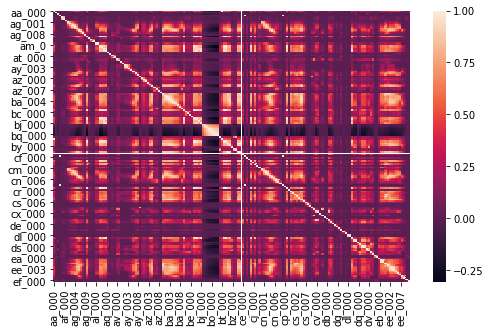

In [7]:
plt.figure(figsize=(8, 5))
sns.heatmap(aps_df.corr())

### (biv) Pick top features with highest CV , and make scatter plots and box plots for them 

In [57]:
num_features = np.floor(np.sqrt(170))
sorted_df = coeff_df.sort_values(by=['coeff_var'], ascending=False)
top_cv = sorted(list(sorted_df.iloc[:int(num_features),:].index))
top_cv_df = aps_df.loc[:, top_cv]
top_cv_df.head()

,ac_000,ad_000,ay_001,bb_000,cf_000,co_000,cs_009,df_000,dh_000,dl_000,dq_000,du_000,eb_000
0,2.130706e+09,280.000000,0.0,6700214.0,2.000000,220.000000,0.0,0.0,0.0,0.0,0.0,14745580.0,2801180.0
1,0.000000e+00,190620.639314,0.0,3646660.0,190221.810984,190515.566938,0.0,0.0,0.0,0.0,0.0,4510080.0,3477820.0
2,2.280000e+02,100.000000,0.0,2673338.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,300240.0,1040120.0
3,7.000000e+01,66.000000,0.0,21614.0,2.000000,2.000000,0.0,0.0,0.0,0.0,2014.0,15740.0,0.0
4,1.368000e+03,458.000000,0.0,4289260.0,0.000000,202.000000,0.0,0.0,0.0,0.0,0.0,457040.0,21173050.0


In [59]:
new_df = top_cv_df
new_df['class'] = aps_df['class']

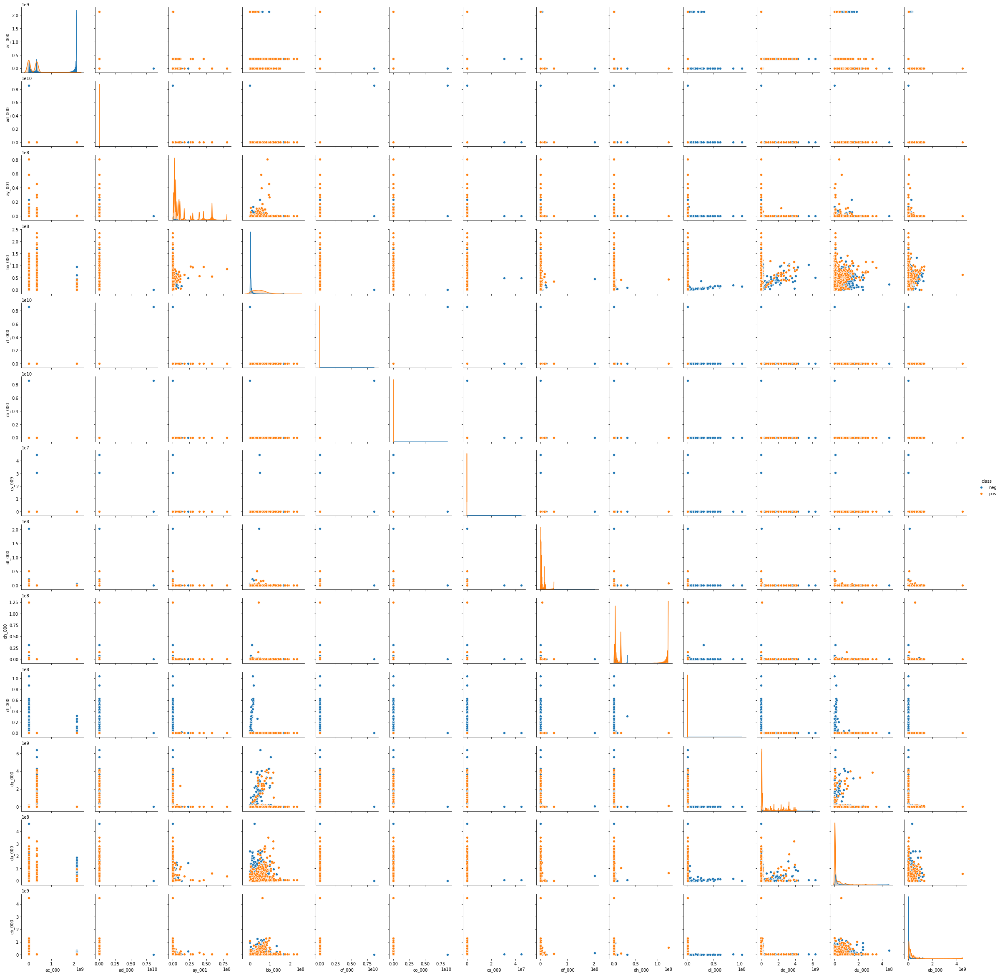

In [61]:
sns.pairplot(new_df, hue = "class", diag_kind='kde')

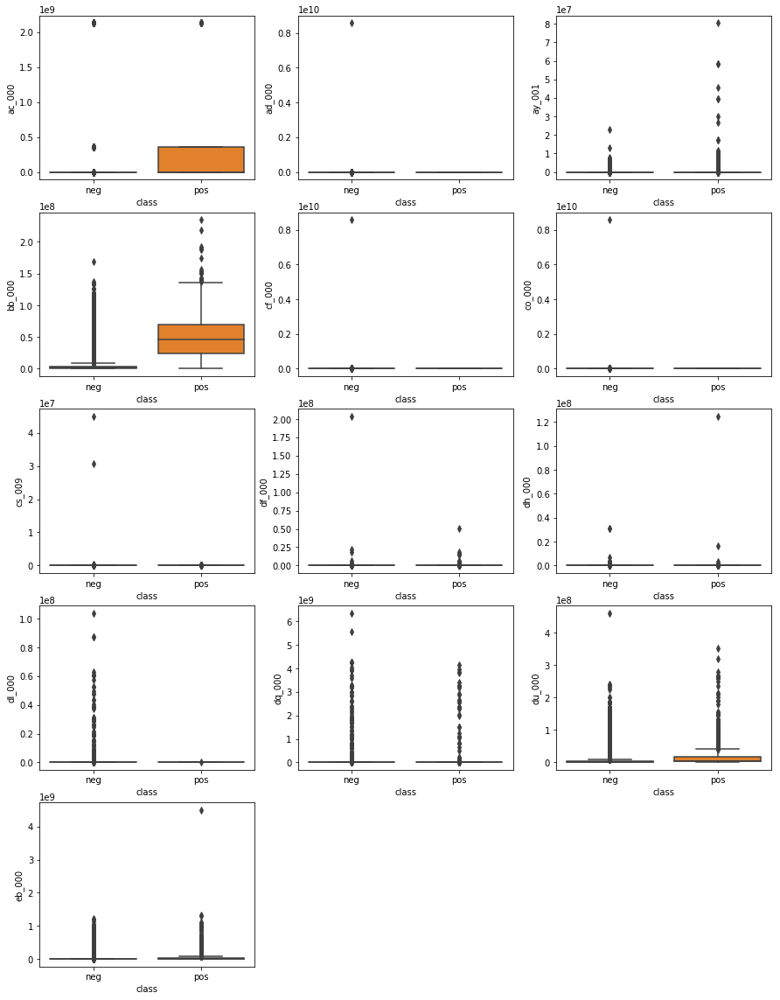

In [212]:
plt.figure(figsize=(15,20))
subplt = 1
for i in range(0,len(top_cv)):
    plt.subplot(5,3, subplt)
    sns.boxplot(x = 'class', y = top_cv[i], data=aps_df)
    subplt += 1

Based on the scatterplots, there are positive correlations between dq_000 and du_000 as well as dq_000 and bb_000. du_000 and bb_000 seem to be slightly correlated with each other. There also could potentially be a correlation between bb_000 and eb_000.

### (bv) Determine the number of positive and negative data. 

In [218]:
neg_count = aps_df[aps_df['class'] == 'neg'].shape[0]
pos_count = aps_df[aps_df['class'] == 'pos'].shape[0]

print(neg_count)
print(pos_count)

74625
1375


There is 74,625 negative data and 1375 positive data. The data is imbalanced since the entire dataset only 1.8% of the datapoints belong to the positive class, while 98.2% of the datapoints belong to the negative class.

### (c) Train a random forest to classify the data set.

In [57]:
train_df['class'] = train_df['class'].apply(lambda x: 1 if x == 'pos' else 0)
test_df['class'] = test_df['class'].apply(lambda x: 1 if x == 'pos' else 0)

X_train = train_df.iloc[:,1:]
y_train = train_df.iloc[:,0]
X_test = test_df.iloc[:,1:]
y_test = test_df.iloc[:,0]

clf = RandomForestClassifier(n_estimators=100, random_state=0, oob_score=True)  
clf.fit(X_train, y_train) 
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)

In [12]:
# Training Data
tn, fp, fn, tp = confusion_matrix(y_train, y_train_pred.round()).ravel()
print('\nThe confusion matrix for train data is: ')
                    
data = [[tp, fn], [fp, tn]]
confusion_df = pd.DataFrame(data, columns=["Predicted Positive", "Predicted Negative"])
confusion_df = confusion_df.rename(index={0: 'Actual Positive', 1: 'Actual Negative'})
print(confusion_df)


The confusion matrix for train data is: 
                 Predicted Positive  Predicted Negative
Actual Positive                1000                   0
Actual Negative                   0               59000


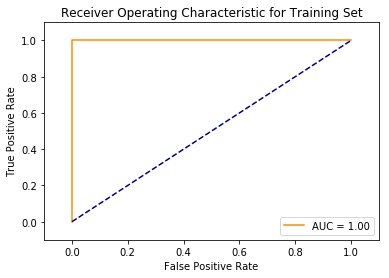

The misclassification rate for training set is: 0.0


In [14]:
fpr, tpr, thresholds = roc_curve(y_train, y_train_pred)
roc_auc = auc(fpr,tpr)
plt.plot(fpr, tpr, color='darkorange', label='AUC = %0.2f' % roc_auc)
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Training Set')
plt.show()

misclass_rate_train = 1 - accuracy_score(y_train, y_train_pred.round())
print('The misclassification rate for training set is:', round(misclass_rate_train,3))

In [15]:
# Test Data
tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred.round()).ravel()
print('\nThe confusion matrix for test data is: ')
                    
data = [[tp, fn], [fp, tn]]
confusion_df = pd.DataFrame(data, columns=["Predicted Positive", "Predicted Negative"])
confusion_df = confusion_df.rename(index={0: 'Actual Positive', 1: 'Actual Negative'})
print(confusion_df)


The confusion matrix for test data is: 
                 Predicted Positive  Predicted Negative
Actual Positive                 269                 106
Actual Negative                  21               15604


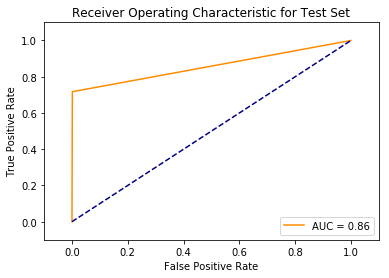

The misclassification rate for test set is:  0.008


In [16]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)
roc_auc = auc(fpr,tpr)
plt.plot(fpr, tpr, color='darkorange', label='AUC = %0.2f' % roc_auc)
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Test Set')
plt.show()

misclass_rate_test = 1 - accuracy_score(y_test, y_test_pred.round())
print('The misclassification rate for test set is: ', round(misclass_rate_test,3))

In [23]:
oob_error = 1- clf.oob_score_
test_error = 1 - clf.score(X_test, y_test)
print('The OOB error for random forest is:', round(oob_error,3), 'while the test error is', round(test_error,3))
print('The test error is only slightly higher than the OOB error.')

The OOB error for random forest is: 0.006 while the test error is 0.008
The test error is only slightly higher than the OOB error.


### (d) Compensate for class imbalance in your random forest and repeat 2c. 

The Random Forest Classifier method has a parameter that can be added where classes are automatically weighted inversely proportional to how frequently they appear in the data.

In [24]:
clf_balanced = RandomForestClassifier(n_estimators=100, random_state=0, oob_score=True, class_weight='balanced')  
clf_balanced.fit(X_train, y_train) 
y_train_balanced = clf_balanced.predict(X_train)
y_test_balanced = clf_balanced.predict(X_test)

In [25]:
# Training Data
tn, fp, fn, tp = confusion_matrix(y_train, y_train_balanced.round()).ravel()
print('\nThe confusion matrix for balanced train data is: ')
                    
data = [[tp, fn], [fp, tn]]
confusion_df = pd.DataFrame(data, columns=["Predicted Positive", "Predicted Negative"])
confusion_df = confusion_df.rename(index={0: 'Actual Positivel', 1: 'Actual Negative'})
print(confusion_df)



The confusion matrix for balanced train data is: 
                  Predicted Positive  Predicted Negative
Actual Positivel                1000                   0
Actual Negative                    0               59000


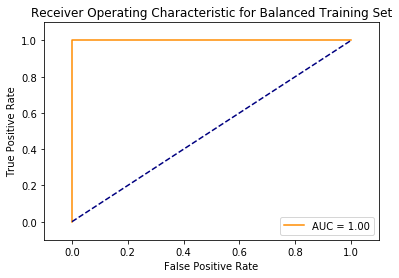

The misclassification rate for training set is: 0.0


In [26]:
fpr, tpr, thresholds = roc_curve(y_train, y_train_balanced)
roc_auc = auc(fpr,tpr)
plt.plot(fpr, tpr, color='darkorange', label='AUC = %0.2f' % roc_auc)
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Balanced Training Set')
plt.show()

misclass_rate_train = 1 - accuracy_score(y_train, y_train_balanced.round())
print('The misclassification rate for training set is:', round(misclass_rate_train,3))

In [27]:
# Test Data
tn, fp, fn, tp = confusion_matrix(y_test, y_test_balanced.round()).ravel()
print('\nThe confusion matrix for balanced test data is: ')
                    
data = [[tp, fn], [fp, tn]]
confusion_df = pd.DataFrame(data, columns=["Predicted Positive", "Predicted Negative"])
confusion_df = confusion_df.rename(index={0: 'Actual Positive', 1: 'Actual Negative'})
print(confusion_df)


The confusion matrix for balanced test data is: 
                 Predicted Positive  Predicted Negative
Actual Positive                 206                 169
Actual Negative                  14               15611


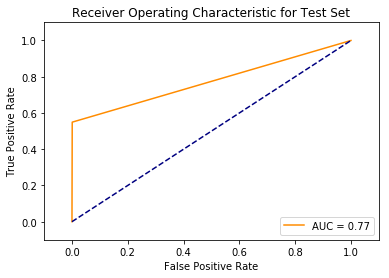

The misclassification rate for test set is: 0.011


In [28]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_balanced)
roc_auc = auc(fpr,tpr)
plt.plot(fpr, tpr, color='darkorange', label='AUC = %0.2f' % roc_auc)
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Test Set')
plt.show()

misclass_rate_test = 1 - accuracy_score(y_test, y_test_balanced.round())
print('The misclassification rate for test set is:', round(misclass_rate_test,3))

In [29]:
oob_error = 1- clf_balanced.oob_score_
test_error = 1 - clf_balanced.score(X_test, y_test)
print('The OOB error for random forest is:', round(oob_error,3), 'while the test error is', round(test_error,3))

The OOB error for random forest is: 0.008 while the test error is 0.011


The uncompensated and balanced case both performed the same on the training set with a misclassification rate of 0.0. The test error was also the same for both cases, which was 0.011. However, the misclassification rate on test set and OOB error for the uncompensated case was slightly better than the balanced case. The misclassification rate on test set was 0.008 for uncompensated case and 0.011 for balanced case , while OOB error was 0.006 for uncompensated case and 0.008 for balanced case. 

### (e) Model Trees

Weka code referenced: https://github.com/fracpete/python-weka-wrapper3/blob/master/doc/source/examples.rst

In [1]:
import weka.core.jvm as jvm
jvm.start(packages=True)
from weka.core.converters import Loader
from weka.classifiers import Classifier
from weka.classifiers import Evaluation
from weka.classifiers import Random
from weka.plot.classifiers import plot_roc

DEBUG:weka.core.jvm:Adding bundled jars
DEBUG:weka.core.jvm:Classpath=['/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/javabridge/jars/rhino-1.7R4.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/javabridge/jars/runnablequeue.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/javabridge/jars/cpython.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/weka/lib/python-weka-wrapper.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/weka/lib/weka.jar']
DEBUG:weka.core.jvm:MaxHeapSize=default
DEBUG:weka.core.jvm:Package support enabled


In [58]:
train_df['class'] = train_df['class'].replace(1, 'pos')
train_df['class'] = train_df['class'].replace(0, 'neg')
test_df['class'] = test_df['class'].replace(1, 'pos')
test_df['class'] = test_df['class'].replace(0, 'neg')

In [61]:
train_df.to_csv('train_df.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")
train = loader.load_file("train_df.csv")
train.class_is_first()

In [62]:
clf = Classifier(classname="weka.classifiers.trees.LMT")
evaluation = Evaluation(train)
evaluation.crossvalidate_model(clf, train, 5, Random(1))

In [63]:
print('Training Set Summary')
print(evaluation.summary())

Training Set Summary

Correctly Classified Instances       59504               99.1733 %
Incorrectly Classified Instances       496                0.8267 %
Kappa statistic                          0.7194
Mean absolute error                      0.0118
Root mean squared error                  0.0822
Relative absolute error                 35.8868 %
Root relative squared error             64.1759 %
Total Number of Instances            60000     



In [64]:
print('Training Set:')
print(evaluation.matrix())

Training Set:
=== Confusion Matrix ===

     a     b   <-- classified as
 58855   145 |     a = neg
   351   649 |     b = pos



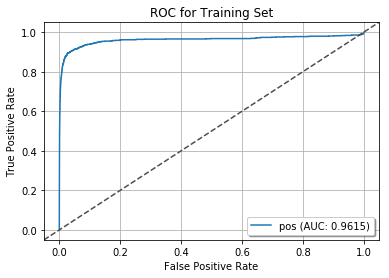

In [65]:
plot_roc(evaluation, title='ROC for Training Set', class_index=[1], wait=False)

In [29]:
test_df.to_csv('test_df.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")
test = loader.load_file('test_df.csv')
test.class_is_first()

In [32]:
clf = Classifier(classname="weka.classifiers.trees.LMT")
clf.build_classifier(train)
eval_test = Evaluation(train)
eval_test.test_model(clf, test)

array([0., 0., 0., ..., 0., 0., 0.])

In [51]:
print('Testing Set Summary')
print(eval_test.summary())

Testing Set Summary

Correctly Classified Instances       15844               99.025  %
Incorrectly Classified Instances       156                0.975  %
Kappa statistic                          0.7643
Mean absolute error                      0.0133
Root mean squared error                  0.0893
Relative absolute error                 33.8486 %
Root relative squared error             58.9356 %
Total Number of Instances            16000     



In [48]:
print('Testing Set')
print(eval_test.matrix())

Testing Set
=== Confusion Matrix ===

     a     b   <-- classified as
 15584    41 |     a = neg
   115   260 |     b = pos



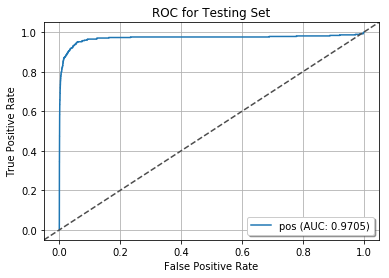

In [49]:
plot_roc(eval_test, title='ROC for Testing Set', class_index=[1], wait=False)

Using 5 fold cross validation, the training set had a MSE of 0.0118 and 0.8267% of instances were incorrectly classified. The test set had a MSE of 0.0133 and 0.975% of instances were incorrectly classified. The training set performed slightly better than the test set since it was able to classify more instances correctly and had a lower MSE. However, the difference in error between these two was really small. Both performed well as they were able to classify over 99% of the instances correctly.

### (f) Use SMOTE to pre-process your data to compensate for class imbalance 

In [67]:
from imblearn.over_sampling import SMOTE
y_test = y_test.to_frame()
y_train = y_train.to_frame()

In [68]:
y_train['class'] = y_train['class'].replace(1, 'pos')
y_train['class'] = y_train['class'].replace(0, 'neg')
y_test['class'] = y_test['class'].replace(1, 'pos')
y_test['class'] = y_test['class'].replace(0, 'neg')

sm = SMOTE()
X_train_res, y_train_res = sm.fit_sample(X_train, y_train.values.ravel())
X_test_res, y_test_res = sm.fit_sample(X_test, y_test.values.ravel())

train_res_df = pd.DataFrame(X_train_res)
y_train_res = pd.DataFrame(y_train_res, columns=['class'])
train_res_df['class'] = y_train_res['class']
test_res_df = pd.DataFrame(X_test_res)
y_test_res = pd.DataFrame(y_test_res, columns=['class'])
test_res_df['class'] = y_test_res['class']

In [69]:
train_res_df.to_csv('train_res_df.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")
train_res = loader.load_file("train_res_df.csv")
train_res.class_is_last()

In [71]:
clf = Classifier(classname="weka.classifiers.trees.LMT")
evaluation_smote = Evaluation(train_res)
evaluation_smote.crossvalidate_model(clf, train_res, 5, Random(1))

In [73]:
print('Training Set with SMOTE Summary')
print(evaluation_smote.summary())

Training Set with SMOTE Summary

Correctly Classified Instances      116123               98.4093 %
Incorrectly Classified Instances      1877                1.5907 %
Kappa statistic                          0.9682
Mean absolute error                      0.0266
Root mean squared error                  0.115 
Relative absolute error                  5.3299 %
Root relative squared error             23.0058 %
Total Number of Instances           118000     



In [74]:
print('Training Set with SMOTE')
print(evaluation_smote.matrix())

Training Set with SMOTE
=== Confusion Matrix ===

     a     b   <-- classified as
 57978  1022 |     a = neg
   855 58145 |     b = pos



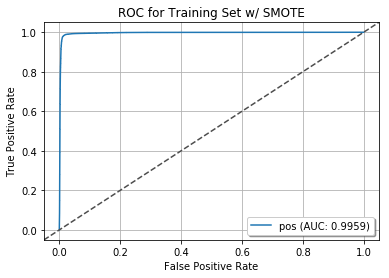

In [75]:
plot_roc(evaluation_smote, title='ROC for Training Set w/ SMOTE', class_index=[1], wait=False)

In [43]:
test_res_df.to_csv('test_res_df.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")
test_res = loader.load_file("test_res_df.csv")
test_res.class_is_last()

In [45]:
clf = Classifier(classname="weka.classifiers.trees.LMT")
clf.build_classifier(train_res)
eval_test_smote = Evaluation(train_res)
eval_test_smote.test_model(clf, test_res)

array([0., 0., 0., ..., 0., 1., 1.])

In [72]:
print('Testing Set with SMOTE Summary')
print(eval_test_smote.summary())

Testing Set with SMOTE Summary

Correctly Classified Instances       29730               95.136  %
Incorrectly Classified Instances      1520                4.864  %
Kappa statistic                          0.9027
Mean absolute error                      0.0559
Root mean squared error                  0.2081
Relative absolute error                 11.182  %
Root relative squared error             41.6261 %
Total Number of Instances            31250     



In [53]:
print('Testing Set')
print(eval_test_smote.matrix())

Testing Set
=== Confusion Matrix ===

     a     b   <-- classified as
 15207   418 |     a = neg
  1102 14523 |     b = pos



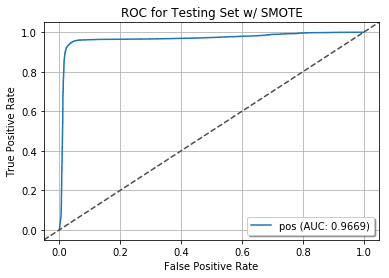

In [54]:
plot_roc(eval_test_smote, title='ROC for Testing Set w/ SMOTE', class_index=[1], wait=False)

The MSE for train/test and % of correctly/incorrectly classified instances for uncompensated case are slightly better than with SMOTE. The AUC for train set with SMOTE is better than that of the train set for uncompensated class, while the AUC for test set of uncompensated class is better than that of the test set with SMOTE. However, the differences between all of these values are really small. For example, the MSE of test set was 0.0133 for uncompensated class and 0.0559 with SMOTE. 

## 3. ISLR 6.8.3

a. As we increase s from 0, the training RSS will: Steadily decrease. When s increases, the L1 budget increases, creating less restriction. As s gets very large, it will shrink the RSS and eventually yield the least squares solution. Therefore, a larger s will cause the training RSS to steadily decrease as the model will fit the training set better with more flexibility.

b. Repeat (a) for test RSS: Decrease initially, and then eventually start increasing in a U shape. When s = 0, all the coefficients will be 0 and the model is extremely simple with a high test RSS. As s increases, the model will become more flexible and the model will start fitting the test data better causing test RSS to decrease. When the test RSS is initially decreasing, the bias decreases faster than that of variance. However, once variance increases more than the decrease in bias, the test RSS will start to increase as well. This is also when the model starts overfitting the training data causing the test RSS to increase.

c. Repeat (a) for variance: Steadily increase. When s = 0, the model has no variance. As s increases, the model  incorporates more coefficients. As the number of coefficients increase, the flexibility of the model will also increase, causing the variance to steadily increase.

d. Repeat (a) for (squared) bias: Steadily decrease. When s = 0, the model will be highly biased. As s increases, the coefficients in the model will move away from zero which will decrease the bias since the model becomes more flexible.

e. Repeat (a) for the irreducible error: Remain Constant. The irreducible error is independent of the model. Therefore, it will not be affected by s and will be constant regardless if s increases.


## 4. ISLR 6.8.5 

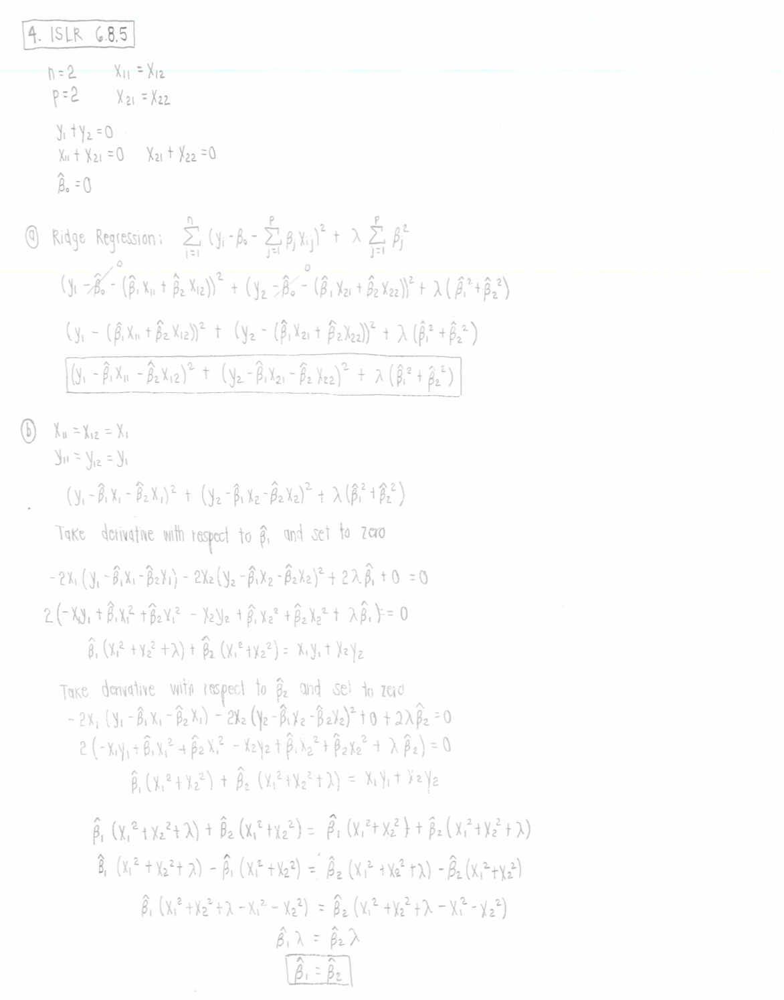

In [95]:
from IPython.display import Image
Image(filename ='6.8.5-1.png')

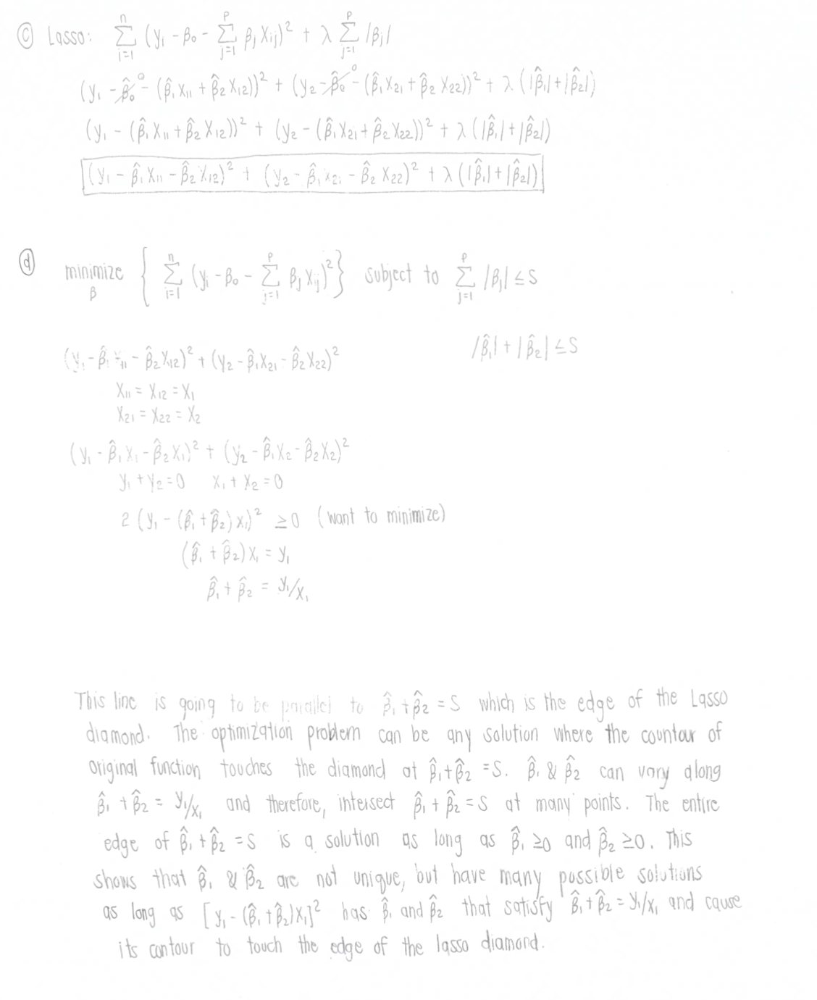

In [84]:
Image(filename ='6.8.5-2.png')

## 5. ISLR 8.4.5

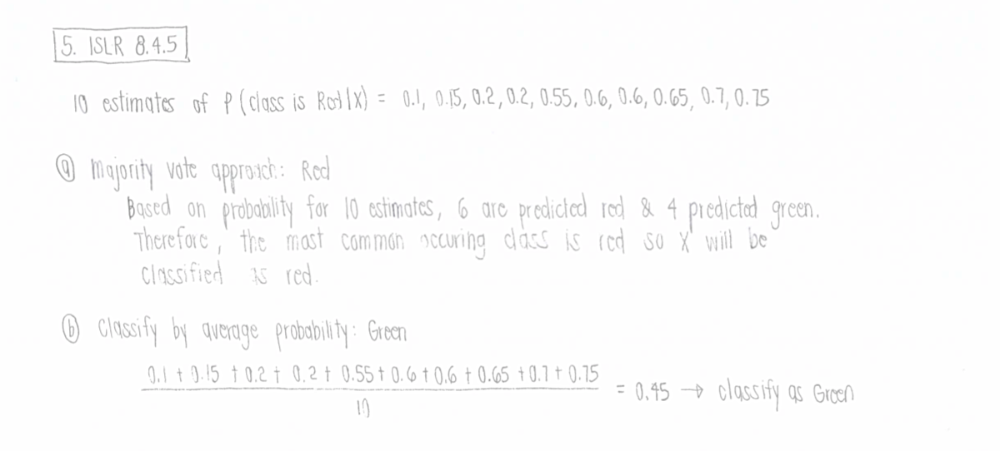

In [80]:
Image(filename ='8.4.5.png')

## 6. ISLR 9.7.3

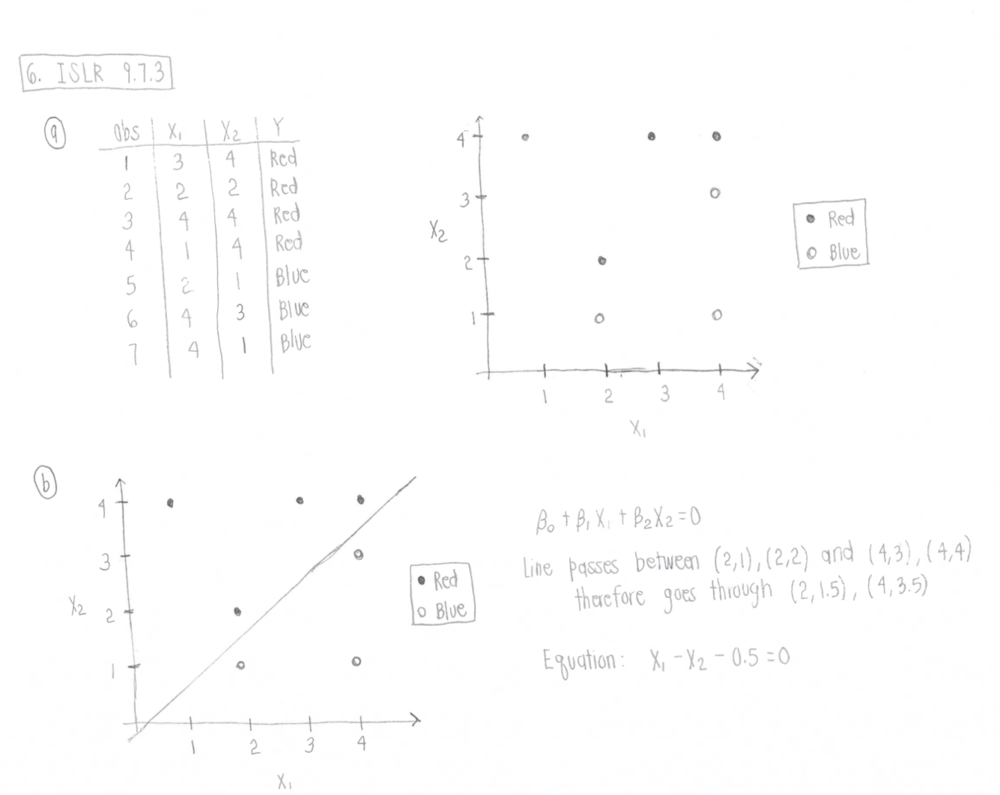

In [87]:
Image(filename ='9.7.3-1.png')

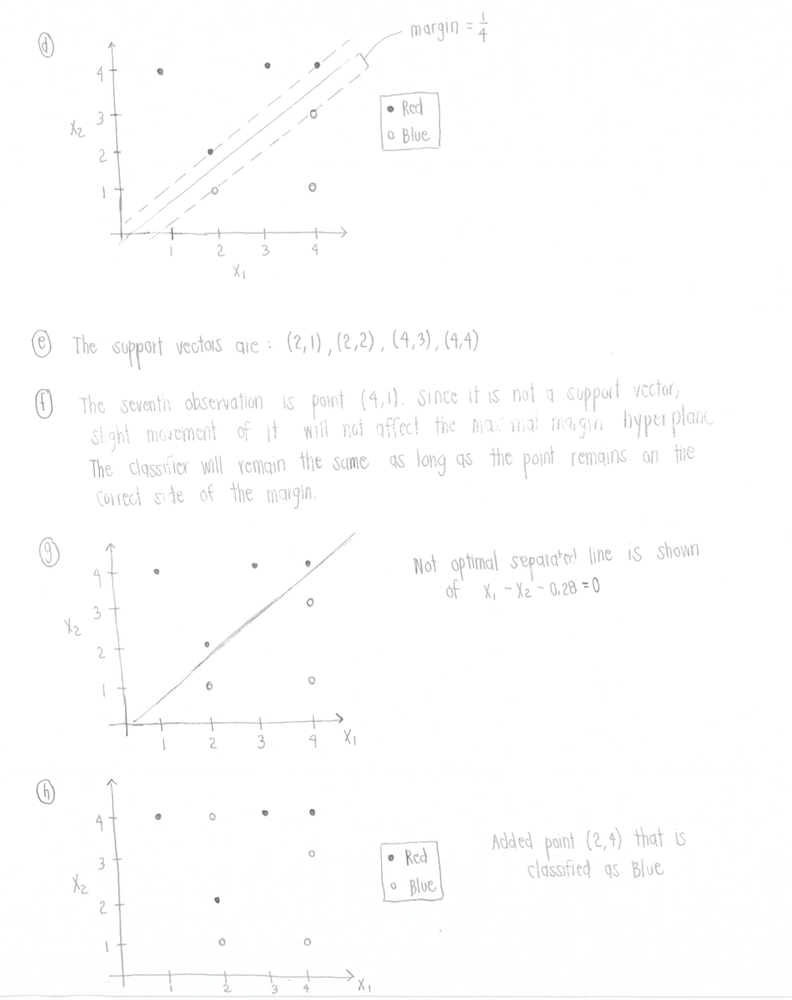

In [86]:
Image(filename ='9.7.3-2.png')